# Intrinsic Optical Imaging - Orientation and Spatial Freqency

## Choose Dataset

In [1]:
using NeuroAnalysis,Plots,Interact,DataFrames,ProgressMeter,Colors,Images
droot = "../VLABDataExport";rroot = "../Result"
sdir = dropdown(filter!(x->x[1]!='.',readdir(droot)),label="Subject")
vlabfile = map(x->dropdown(readdir("$droot/$x"),label="VLab"),signal(sdir))
oifile = map(x->dropdown(readdir("$droot/$x"),label="OIBlock"),signal(sdir))
map(display,[sdir,vlabfile,oifile]);

INFO: Recompiling stale cache file C:\Users\fff00\.julia\lib\v0.6\NeuroAnalysis.ji for module NeuroAnalysis.


Interact.Options{:Dropdown,String}(1: "input" = C1607 String , "Subject", "C1607", "C1607", 1, Interact.OptionDict(DataStructures.OrderedDict("C1607"=>"C1607","C1701"=>"C1701","C1702"=>"C1702","C1703"=>"C1703","C1801"=>"C1801","LSR1801"=>"LSR1801","LZR1602"=>"LZR1602","LZR1603"=>"LZR1603","LZR1604"=>"LZR1604","metadata.mat"=>"metadata.mat"…), Dict("LZR1602"=>"LZR1602","metadata.mat"=>"metadata.mat","C1702"=>"C1702","LZR1604"=>"LZR1604","C1607"=>"C1607","C1701"=>"C1701","C1703"=>"C1703","C1801"=>"C1801","LZR1603"=>"LZR1603","LSR1801"=>"LSR1801"…)), Any[], Any[], true, "horizontal", true)

Interact.Options{:Dropdown,String}(3: "input-2" = C1607-mcherry-2.bmp String , "VLab", "C1607-mcherry-2.bmp", "C1607-mcherry-2.bmp", 1, Interact.OptionDict(DataStructures.OrderedDict("C1607-mcherry-2.bmp"=>"C1607-mcherry-2.bmp","C1607-mcherry-2_roi1x1.bmp"=>"C1607-mcherry-2_roi1x1.bmp","C1607-mcherry.bmp"=>"C1607-mcherry.bmp","C1607-mcherry_roi1x1.bmp"=>"C1607-mcherry_roi1x1.bmp","C1607-ref-1-post.bmp"=>"C1607-ref-1-post.bmp","C1607-ref-1-post_roi1x1.bmp"=>"C1607-ref-1-post_roi1x1.bmp","C1607-ref-2-env chr.bmp"=>"C1607-ref-2-env chr.bmp","C1607-ref-2-env chr_roi1x1.bmp"=>"C1607-ref-2-env chr_roi1x1.bmp","C1607-ref-2-post.bmp"=>"C1607-ref-2-post.bmp","C1607-ref-2-post_roi1x1.bmp"=>"C1607-ref-2-post_roi1x1.bmp"…), Dict("C1607_E0B179.mat"=>"C1607_E0B179.mat","C1607_E0B214.mat"=>"C1607_E0B214.mat","C1607_E0B231.mat"=>"C1607_E0B231.mat","C1607_E0B217.mat"=>"C1607_E0B217.mat","C1607_E0B150.mat"=>"C1607_E0B150.mat","C1607_E0B101.mat"=>"C1607_E0B101.mat","C1607_E0B224.mat"=>"C1607_E0B224.mat","C1607_E0B295.mat"=>"C1607_E0B295.mat","C1607_E0B323.mat"=>"C1607_E0B323.mat","C1607_E0B229.mat"=>"C1607_E0B229.mat"…)), Any[], Any[], true, "horizontal", true)

Interact.Options{:Dropdown,String}(6: "input-3" = C1607-mcherry-2.bmp String , "OIBlock", "C1607-mcherry-2.bmp", "C1607-mcherry-2.bmp", 1, Interact.OptionDict(DataStructures.OrderedDict("C1607-mcherry-2.bmp"=>"C1607-mcherry-2.bmp","C1607-mcherry-2_roi1x1.bmp"=>"C1607-mcherry-2_roi1x1.bmp","C1607-mcherry.bmp"=>"C1607-mcherry.bmp","C1607-mcherry_roi1x1.bmp"=>"C1607-mcherry_roi1x1.bmp","C1607-ref-1-post.bmp"=>"C1607-ref-1-post.bmp","C1607-ref-1-post_roi1x1.bmp"=>"C1607-ref-1-post_roi1x1.bmp","C1607-ref-2-env chr.bmp"=>"C1607-ref-2-env chr.bmp","C1607-ref-2-env chr_roi1x1.bmp"=>"C1607-ref-2-env chr_roi1x1.bmp","C1607-ref-2-post.bmp"=>"C1607-ref-2-post.bmp","C1607-ref-2-post_roi1x1.bmp"=>"C1607-ref-2-post_roi1x1.bmp"…), Dict("C1607_E0B179.mat"=>"C1607_E0B179.mat","C1607_E0B214.mat"=>"C1607_E0B214.mat","C1607_E0B231.mat"=>"C1607_E0B231.mat","C1607_E0B217.mat"=>"C1607_E0B217.mat","C1607_E0B150.mat"=>"C1607_E0B150.mat","C1607_E0B101.mat"=>"C1607_E0B101.mat","C1607_E0B224.mat"=>"C1607_E0B224.mat","C1607_E0B295.mat"=>"C1607_E0B295.mat","C1607_E0B323.mat"=>"C1607_E0B323.mat","C1607_E0B229.mat"=>"C1607_E0B229.mat"…)), Any[], Any[], true, "horizontal", true)

## Prepare Dataset

In [2]:
dataset = prepare("$droot/$(sdir.value)/$(vlabfile.value.value)");ex=dataset["ex"];cond = ex["Cond"]
oifiles = getoifile(subject=ex["Subject_ID"],experimentid=match(r"E([0-9]+)B",oifile.value.value).captures[1],dir=abspath("$droot/$(sdir.value)"))
image=DataFrame(source=oifiles)
dataset["image"]=image;

## Analyze OI Response

In [6]:
nbaseframes = slider(0:2,value=1,label="nbaseframes")

Interact.Slider{Int64}(15: "input-6" = 1 Int64 , "nbaseframes", 1, 0:2, "horizontal", true, "d", true)

In [7]:
stimuli = Int[];response=Any[]
p = ProgressMeter.Progress(size(image,1),1,"Read and Analyze OI Block ...",50)
for i in image[:source]
    block = prepare(i)
    nframesperstim = block["imagehead"]["nframesperstim"]
    baseframeindex = nbaseframes.value<=0?nothing:1:nbaseframes.value
    frameindex = nbaseframes.value<=0?nothing:nbaseframes.value+1:nframesperstim
    stimuli=cat(1,stimuli,block["imagehead"]["listofstimuli"])
    response = push!(response,oiframeresponse(block["image"],frameindex=frameindex,filter=nothing,baseframeindex=baseframeindex))

    if !haskey(dataset,"imagehead")
        dataset["imagehead"]=block["imagehead"]  
    end
    next!(p)
end
image[:stimuli] = stimuli;image[:response] = response;

Read and Analyze OI Block ...100%|██████████████████████████████████████████████████| Time: 0:02:55


In [14]:
blockfl = unique(cond["PositionOffset"])
condblock = [find(cond["PositionOffset"].==[sf]) for sf in blockfl]
blank,cocktail,oimap = oiresponse(response,stimuli,stimuligroup=condblock,sdfactor=3);

In [31]:
blockfl

4-element Array{Array{Float64,1},1}:
 [-7.5, 0.0, 0.0]
 [-2.5, 0.0, 0.0]
 [2.5, 0.0, 0.0] 
 [7.5, 0.0, 0.0] 

## Blank Response

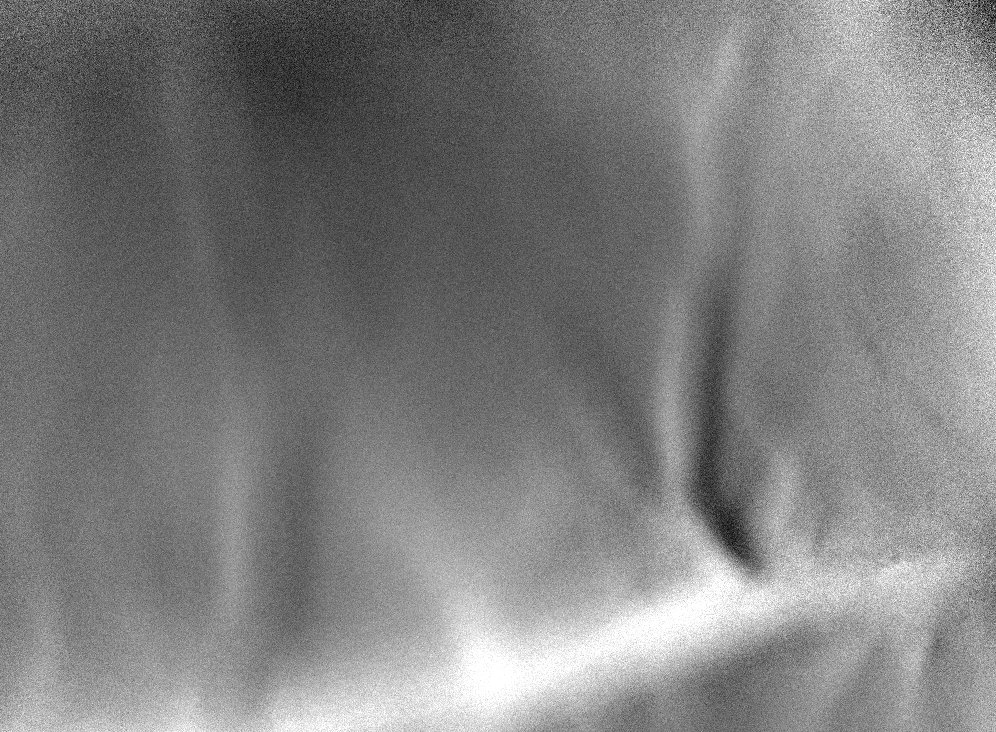

In [15]:
Gray.(clampscale(blank,3))

## Cocktail Response

Interact.Options{:SelectionSlider,Int64}(13: "input-7" = 2 Int64 , "blockindex", 2, "2", 2, Interact.OptionDict(DataStructures.OrderedDict("1"=>1,"2"=>2,"3"=>3,"4"=>4), Dict(4=>"4",2=>"2",3=>"3",1=>"1")), Any[], Any[], true, "horizontal", true)

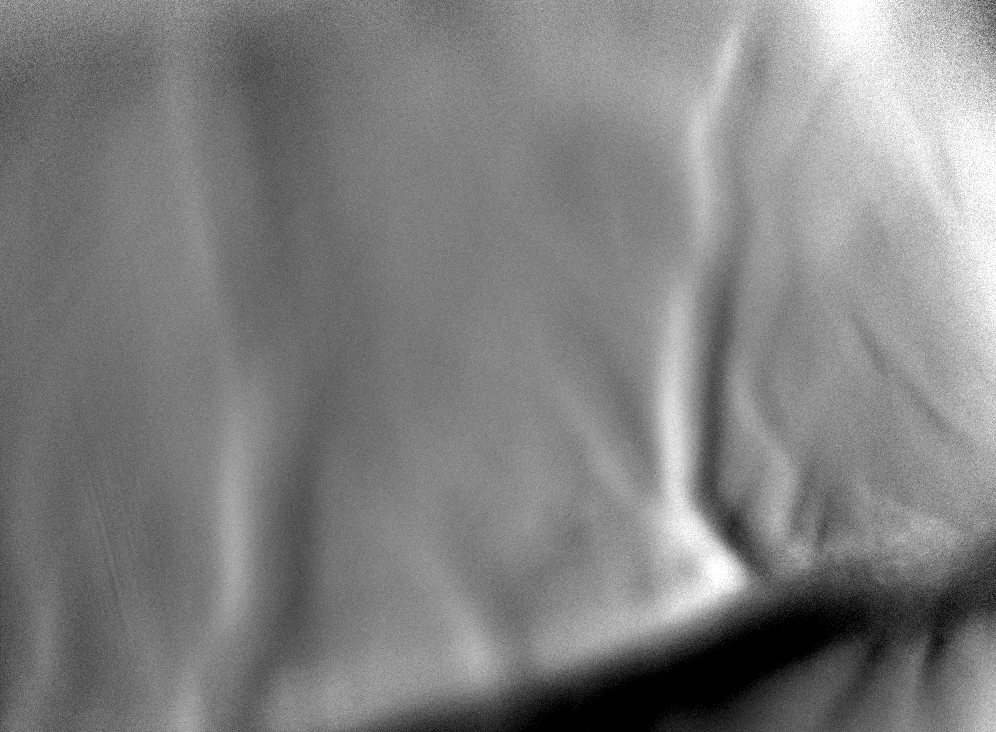

In [16]:
@manipulate for blockindex=1:length(cocktail)
    Gray.(clampscale(cocktail[blockindex],3))
end

## Stimuli Response

Interact.Options{:SelectionSlider,Int64}(17: "input-8" = 16 Int64 , "sid", 16, "16", 16, Interact.OptionDict(DataStructures.OrderedDict("1"=>1,"2"=>2,"3"=>3,"4"=>4,"5"=>5,"6"=>6,"7"=>7,"8"=>8,"9"=>9,"10"=>10…), Dict(18=>"18",30=>"30",32=>"32",2=>"2",16=>"16",11=>"11",21=>"21",7=>"7",9=>"9",25=>"25"…)), Any[], Any[], true, "horizontal", true)

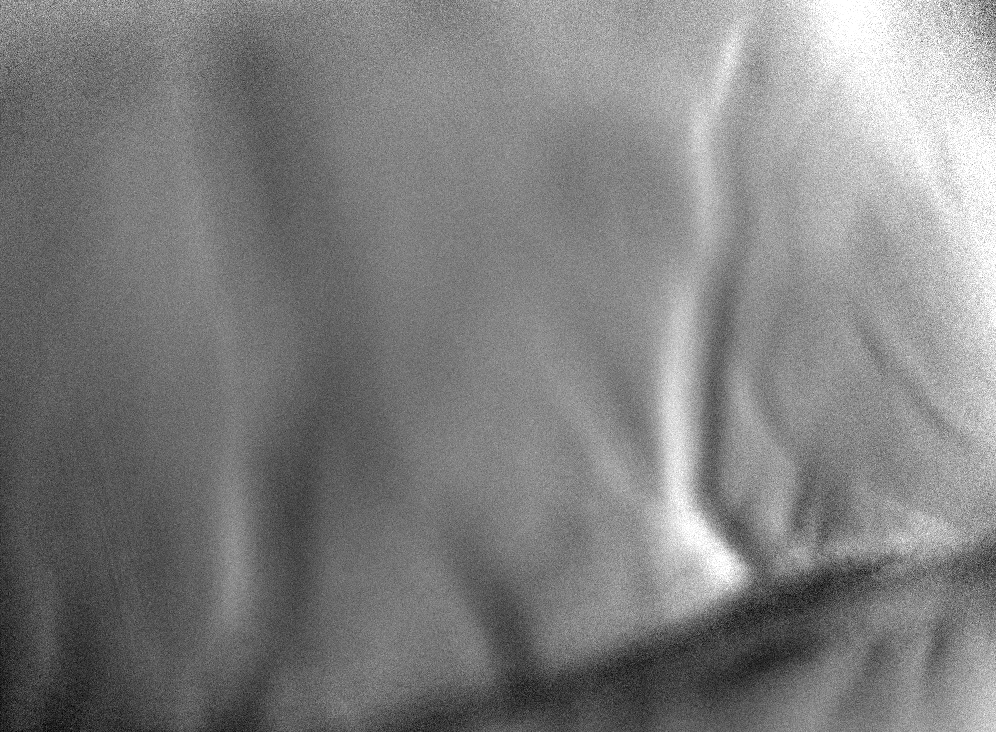

In [17]:
@manipulate for sid=1:size(oimap,1)
    Gray.(clampscale(oimap[:map][sid],3))
end

## Stimuli/Blank Response

Interact.Options{:SelectionSlider,Int64}(21: "input-9" = 16 Int64 , "sid", 16, "16", 16, Interact.OptionDict(DataStructures.OrderedDict("1"=>1,"2"=>2,"3"=>3,"4"=>4,"5"=>5,"6"=>6,"7"=>7,"8"=>8,"9"=>9,"10"=>10…), Dict(18=>"18",30=>"30",32=>"32",2=>"2",16=>"16",11=>"11",21=>"21",7=>"7",9=>"9",25=>"25"…)), Any[], Any[], true, "horizontal", true)

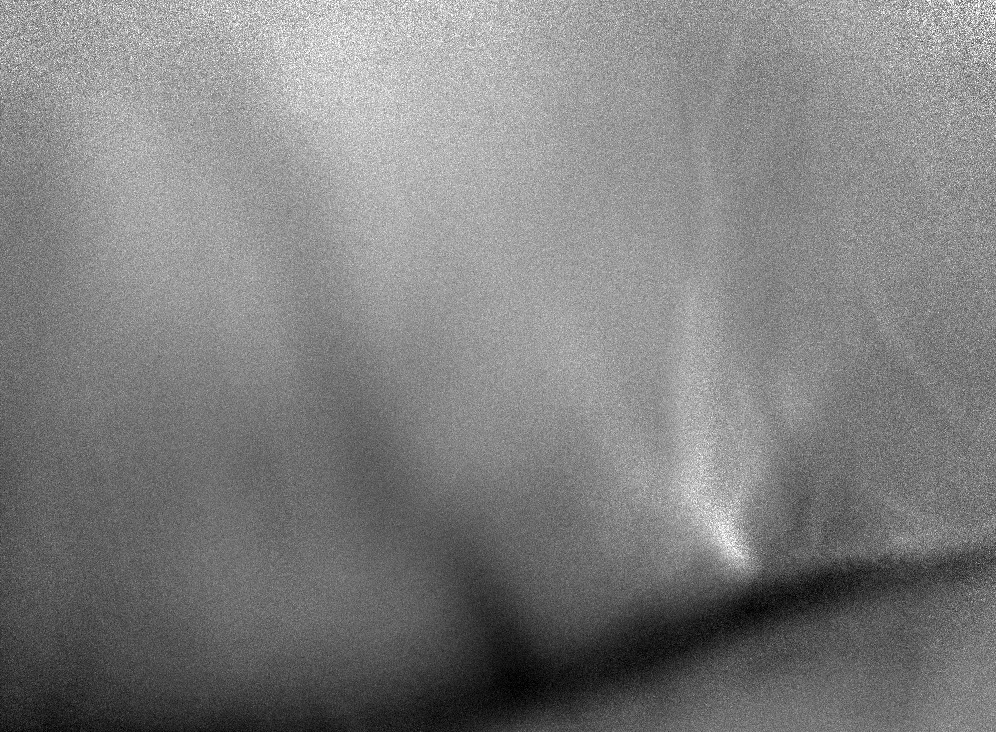

In [18]:
@manipulate for sid=1:size(oimap,1)
    Gray.(clampscale(oimap[:blankmap][sid],3))
end

## Stimuli/Cocktail Response

Interact.Options{:SelectionSlider,Int64}(25: "input-10" = 16 Int64 , "sid", 16, "16", 16, Interact.OptionDict(DataStructures.OrderedDict("1"=>1,"2"=>2,"3"=>3,"4"=>4,"5"=>5,"6"=>6,"7"=>7,"8"=>8,"9"=>9,"10"=>10…), Dict(18=>"18",30=>"30",32=>"32",2=>"2",16=>"16",11=>"11",21=>"21",7=>"7",9=>"9",25=>"25"…)), Any[], Any[], true, "horizontal", true)

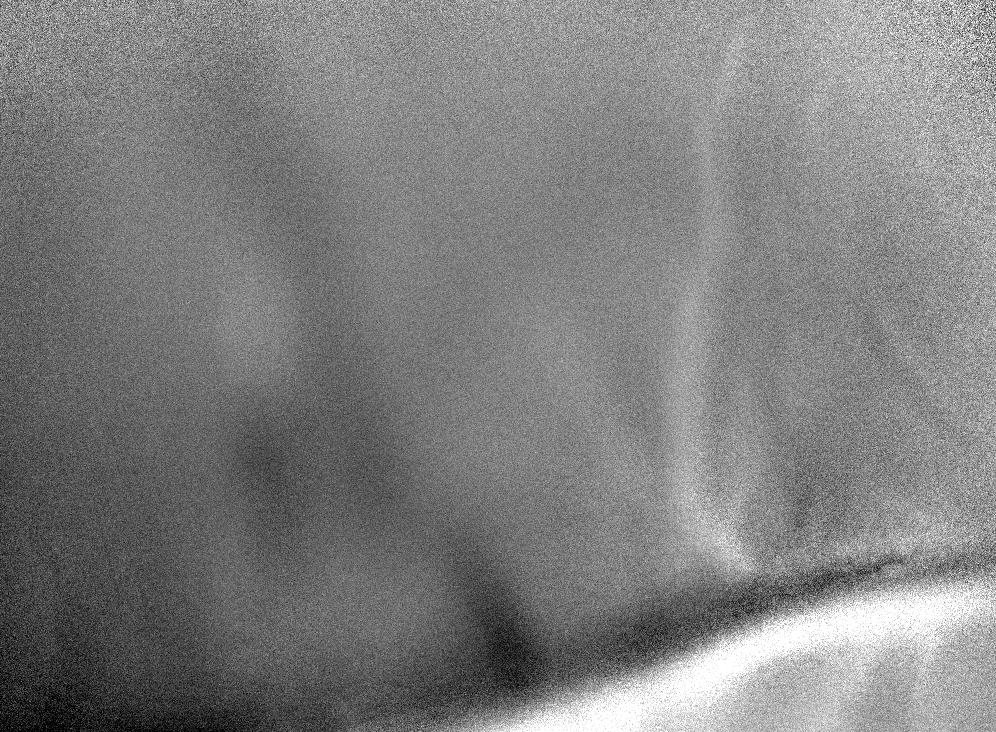

In [19]:
@manipulate for sid=1:size(oimap,1)
    Gray.(clampscale(oimap[:cocktailmap][sid],3))
end

## Color Map

In [20]:
maptype = dropdown(["cocktailmap","blankmap","map"],label="MapType")
sigma1 = slider(0.1:0.1:100.0,value=4.0,label="DoGSigma1")
sigma2 = slider(0.1:0.1:100.0,value=32.0,label="DoGSigma2")
display.([maptype,sigma1,sigma2]);

Interact.Options{:Dropdown,String}(29: "input-11" = cocktailmap String , "MapType", "cocktailmap", "cocktailmap", 1, Interact.OptionDict(DataStructures.OrderedDict("cocktailmap"=>"cocktailmap","blankmap"=>"blankmap","map"=>"map"), Dict("map"=>"map","cocktailmap"=>"cocktailmap","blankmap"=>"blankmap")), Any[], Any[], true, "horizontal", true)

Interact.Slider{Float64}(31: "input-12" = 4.0 Float64 , "DoGSigma1", 4.0, 0.1:0.1:100.0, "horizontal", true, ".3f", true)

Interact.Slider{Float64}(33: "input-13" = 32.0 Float64 , "DoGSigma2", 32.0, 0.1:0.1:100.0, "horizontal", true, ".3f", true)

In [21]:
filter = Kernel.DoG((sigma1.value,sigma2.value));
cammaps=map(i->oicomplexmap(oimap[Symbol(maptype.value)][i],cond["Ori"][oimap[:stimuli][i]],isangledegree=true,isangleinpi=true,
        filter=filter,presdfactor=3,sufsdfactor=3),condblock);

### Angle Map

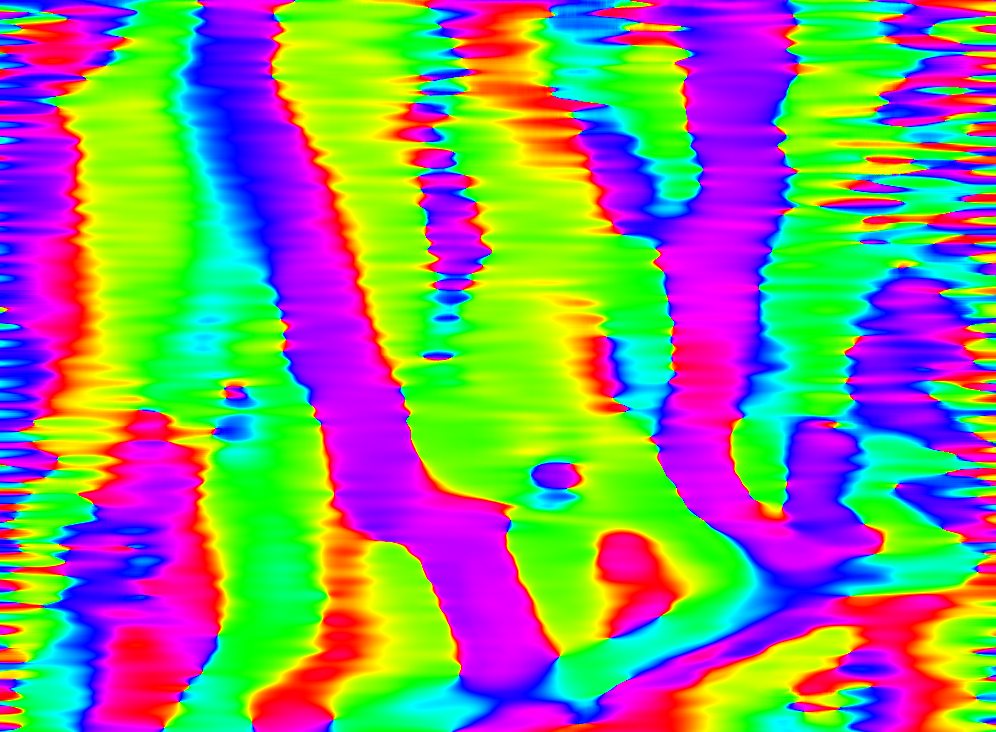

In [22]:
resultmaps=Set()
mapname = Symbol("anglemap_SF$(blockfl[1])")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(a),1,1),cammaps[1]["angle"])))

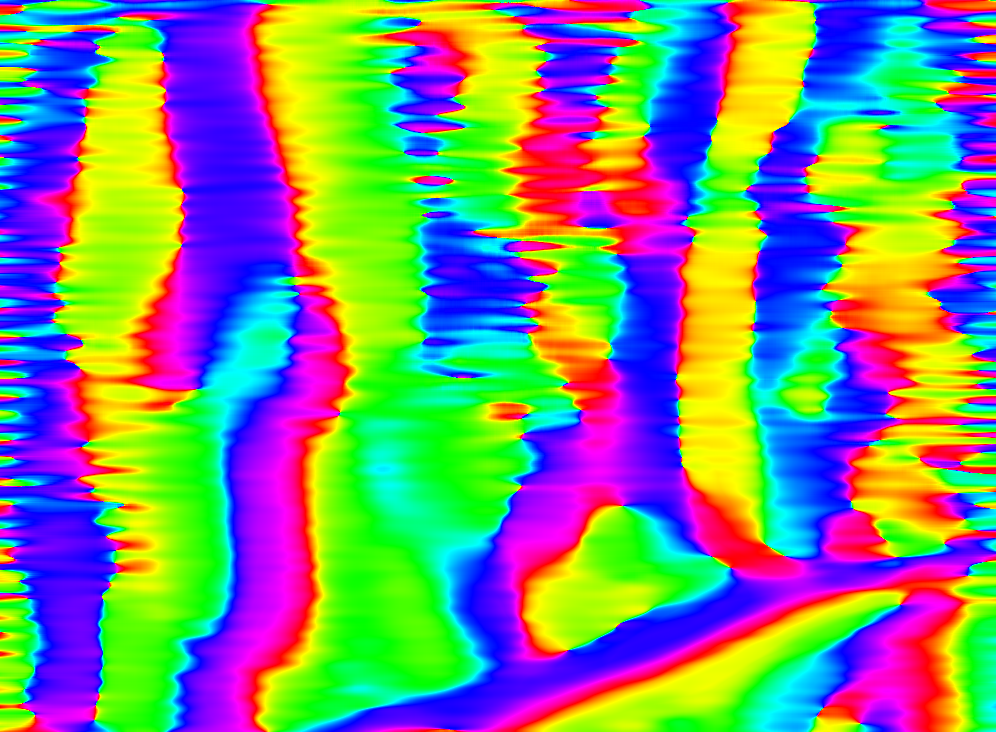

In [23]:
mapname = Symbol("anglemap_SF$(blockfl[2])")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(a),1,1),cammaps[2]["angle"])))

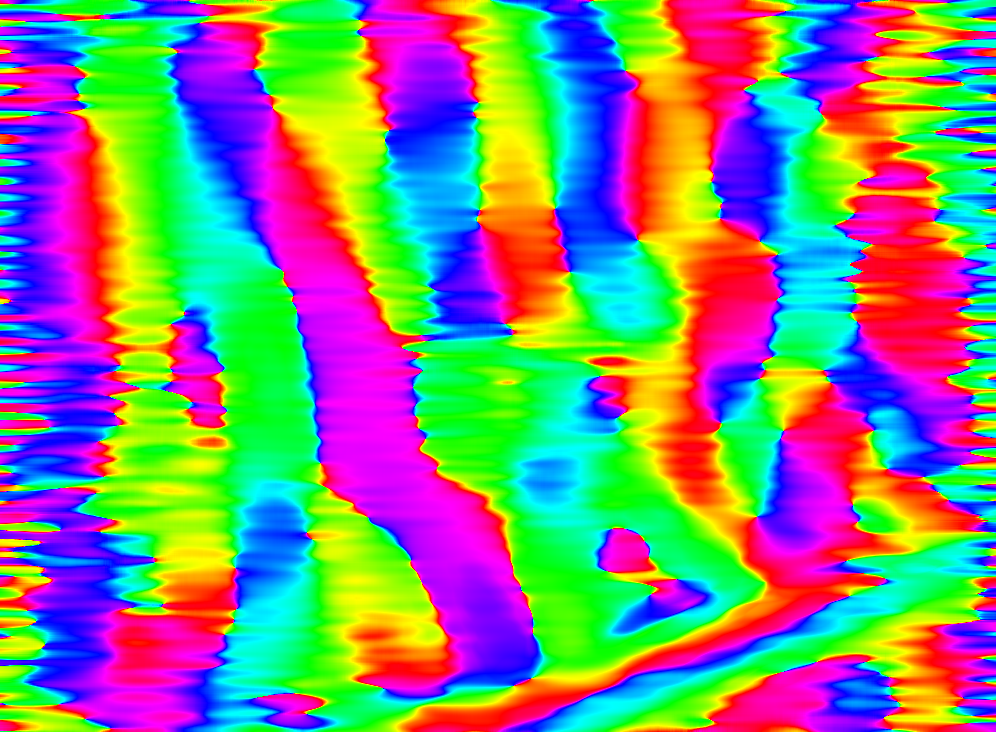

In [24]:
mapname = Symbol("anglemap_SF$(blockfl[3])")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(a),1,1),cammaps[3]["angle"])))

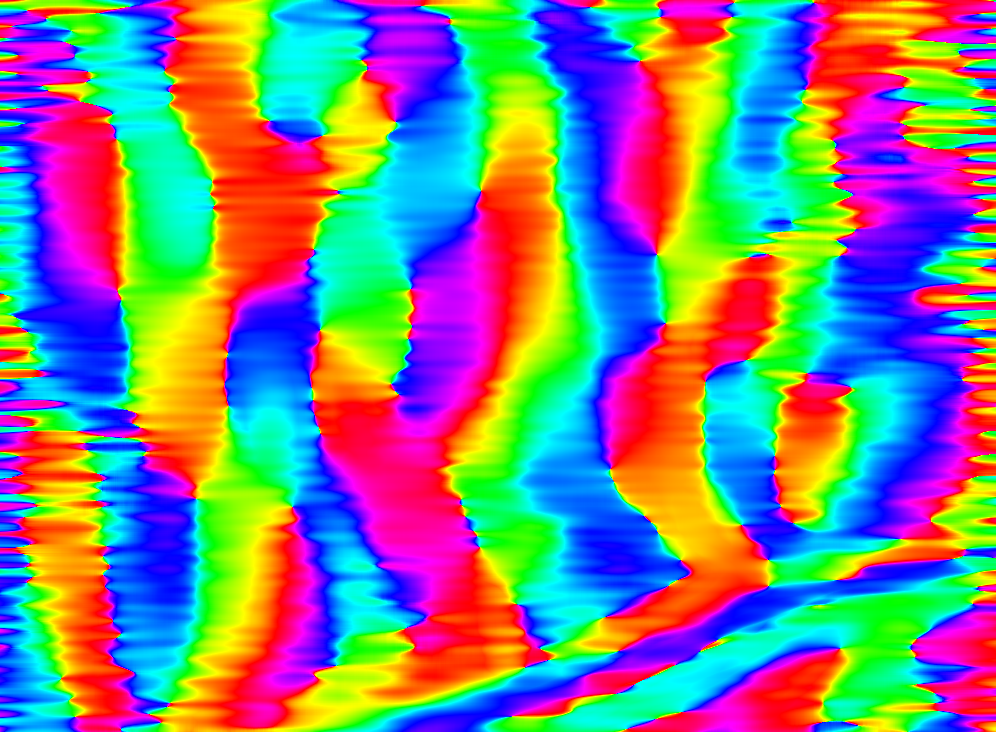

In [29]:
mapname = Symbol("anglemap_SF$(blockfl[4])")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(a),1,1),cammaps[4]["angle"])))

### Polar Map

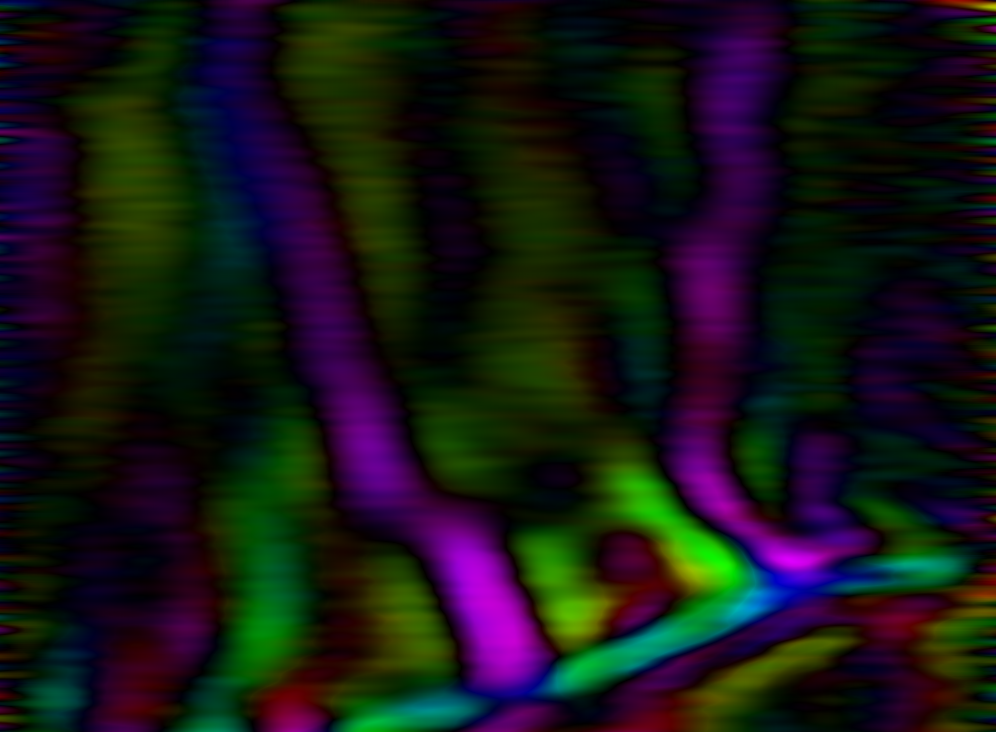

In [25]:
mapname = Symbol("polarmap_SF$(blockfl[1])")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(a),1,m),cammaps[1]["angle"],cammaps[1]["abs"])))

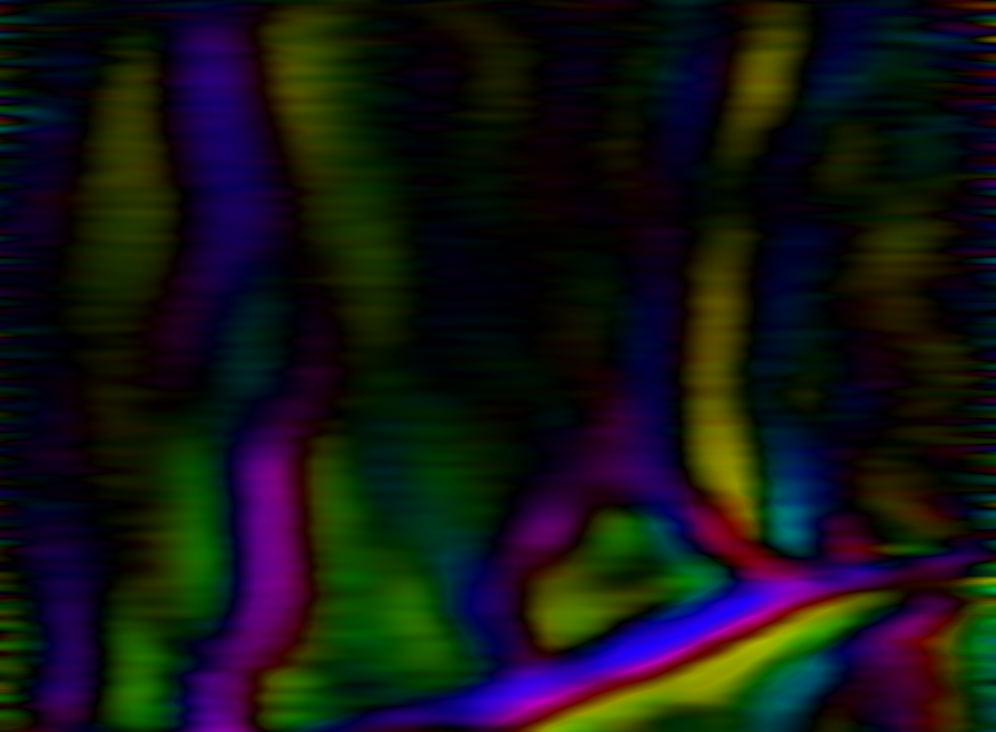

In [26]:
mapname = Symbol("polarmap_SF$(blockfl[2])")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(a),1,m),cammaps[2]["angle"],cammaps[2]["abs"])))

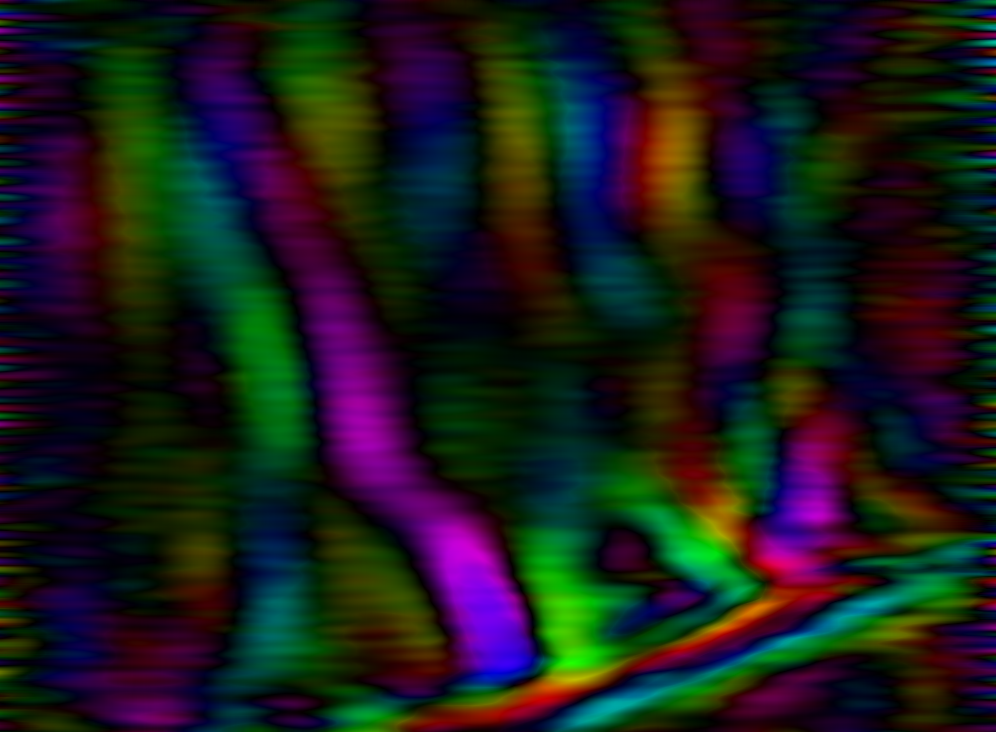

In [27]:
mapname = Symbol("polarmap_SF$(blockfl[3])")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(a),1,m),cammaps[3]["angle"],cammaps[3]["abs"])))

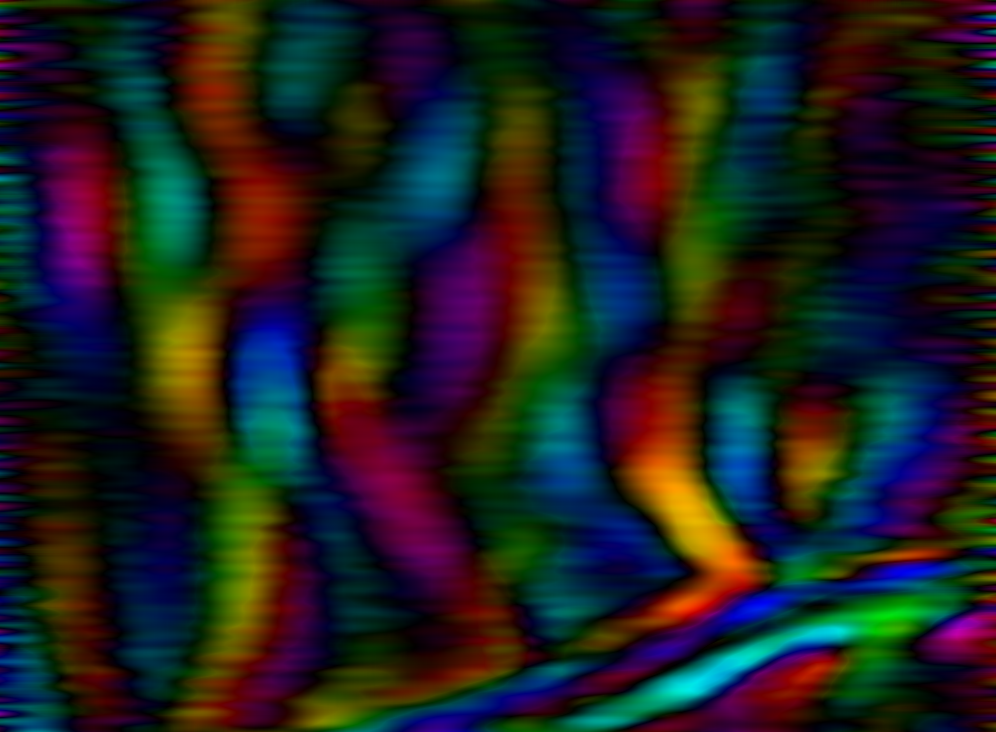

In [28]:
mapname = Symbol("polarmap_SF$(blockfl[4])")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(a),1,m),cammaps[4]["angle"],cammaps[4]["abs"])))

### Stimuli Color Codes

Any[0.0, 22.5, 45.0, 67.5, 90.0, 112.5, 135.0, 157.5]

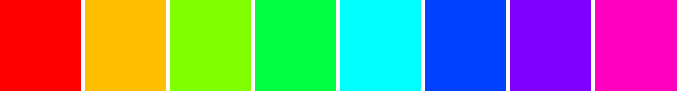

In [75]:
theta=cammaps[1]["rad"];fl=cammaps[1]["deg"]
show(fl)
colorcodes=HSV.(rad2deg.(theta),1,1)

### Angle Domain Map

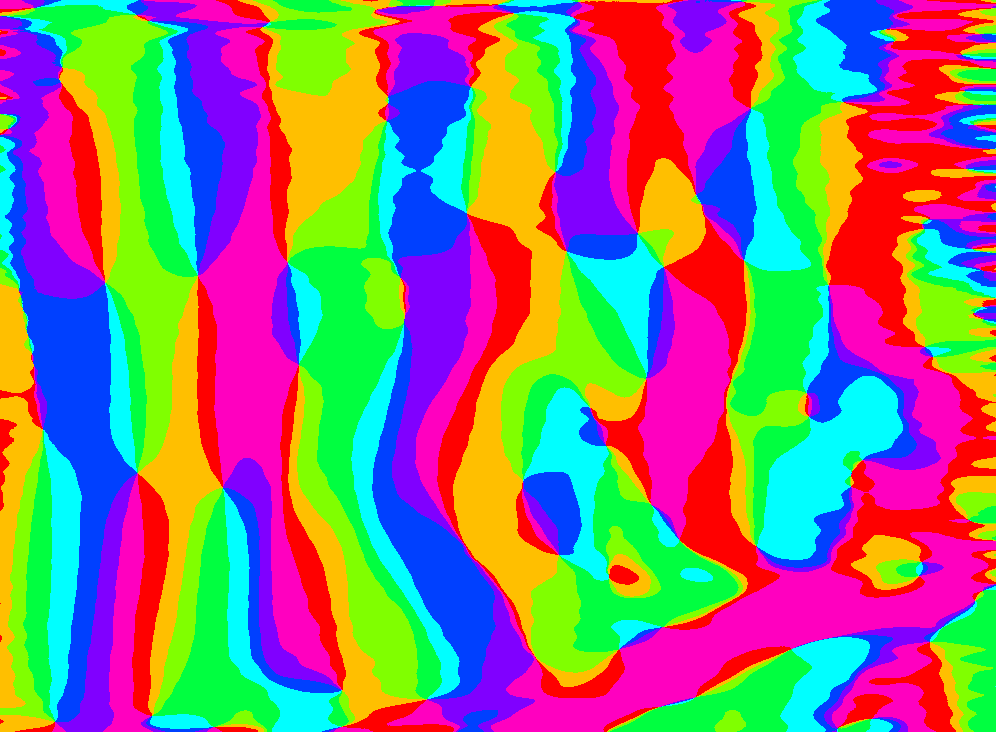

In [76]:
mapname = Symbol("angledomainmap_SF$(blockfl[1])")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(anglemode(a,theta)),1,1),cammaps[1]["angle"])))

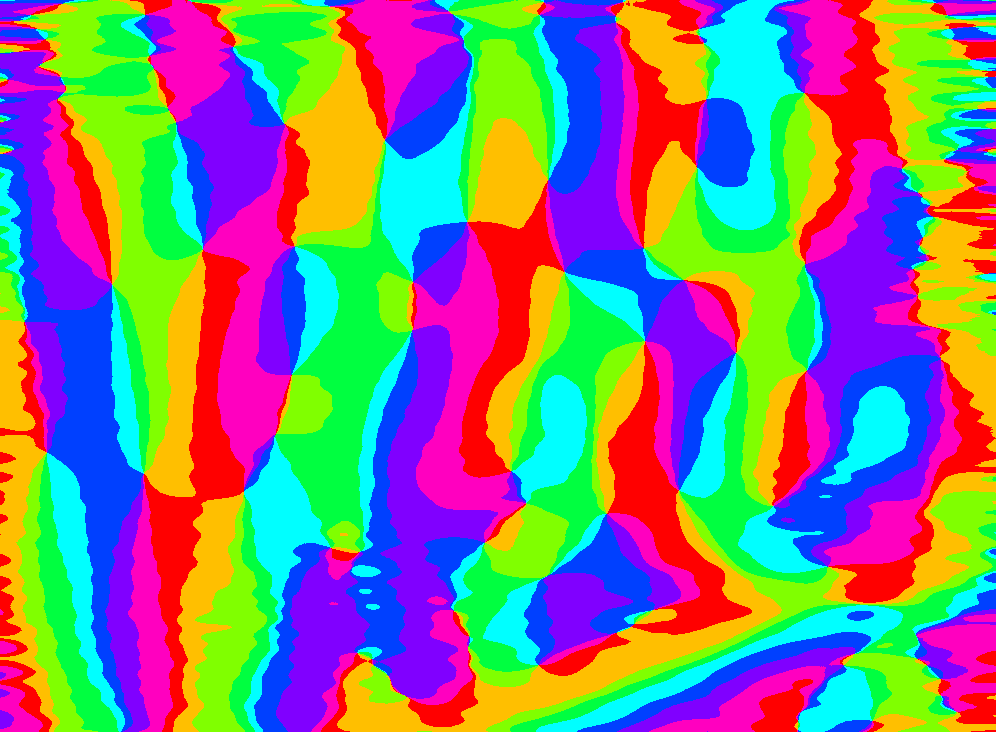

In [77]:
mapname = Symbol("angledomainmap_SF$(blockfl[2])")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(anglemode(a,theta)),1,1),cammaps[2]["angle"])))

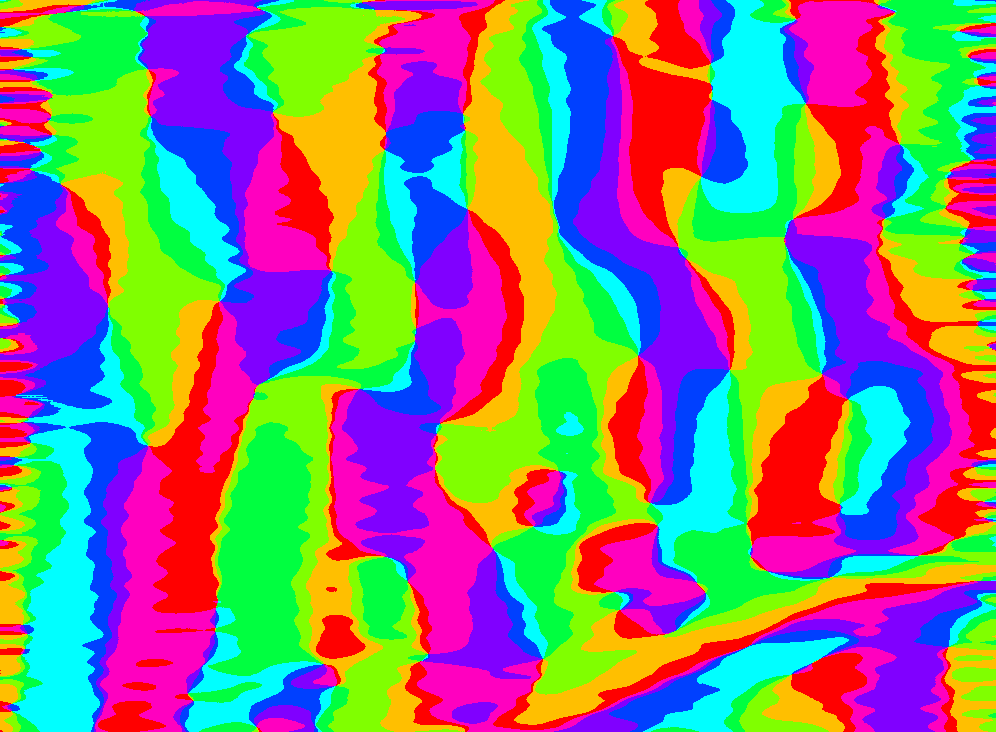

In [78]:
mapname = Symbol("angledomainmap_SF$(blockfl[3])")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(anglemode(a,theta)),1,1),cammaps[3]["angle"])))

### Polar Domain Map

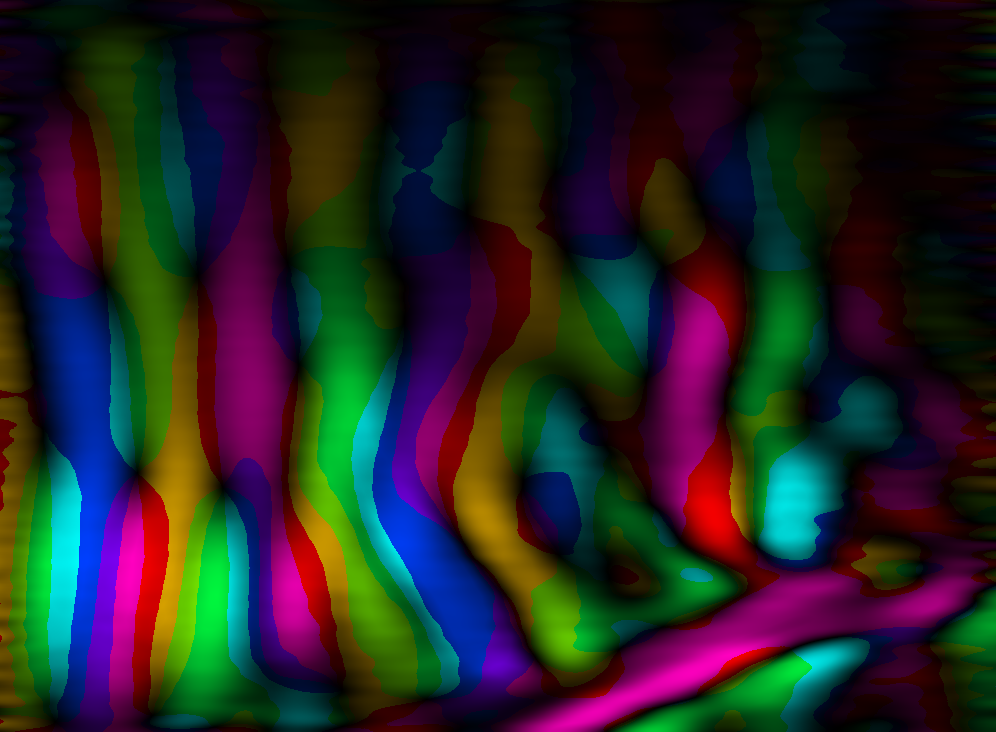

In [79]:
mapname = Symbol("polardomainmap_SF$(blockfl[1])")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(anglemode(a,theta)),1,m),cammaps[1]["angle"],cammaps[1]["abs"])))

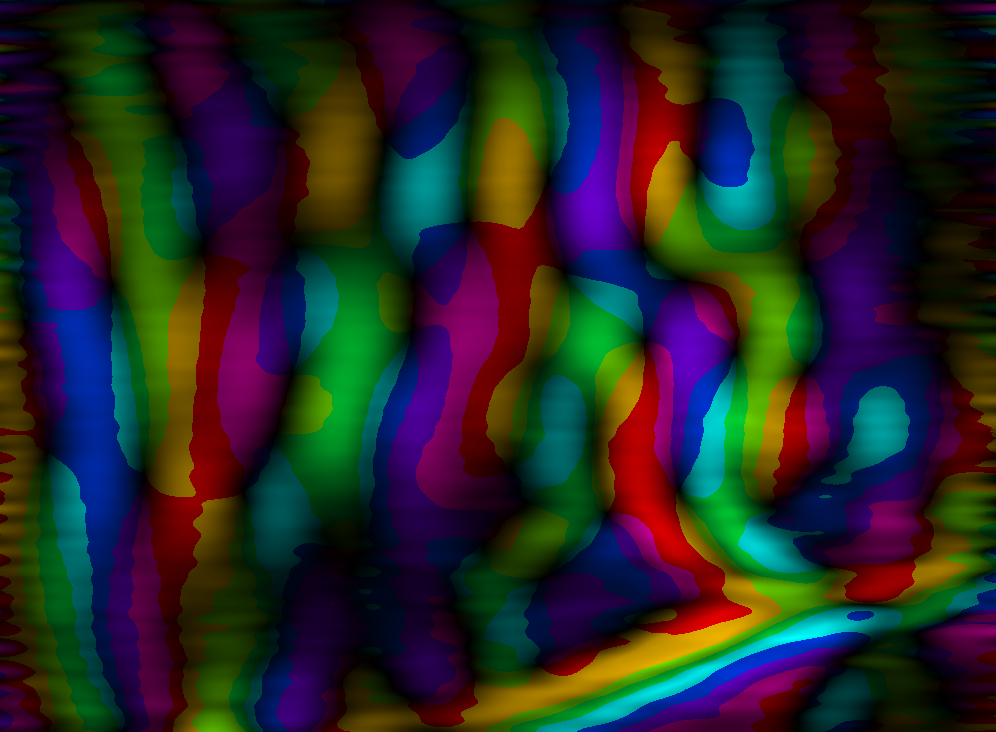

In [80]:
mapname = Symbol("polardomainmap_SF$(blockfl[2])")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(anglemode(a,theta)),1,m),cammaps[2]["angle"],cammaps[2]["abs"])))

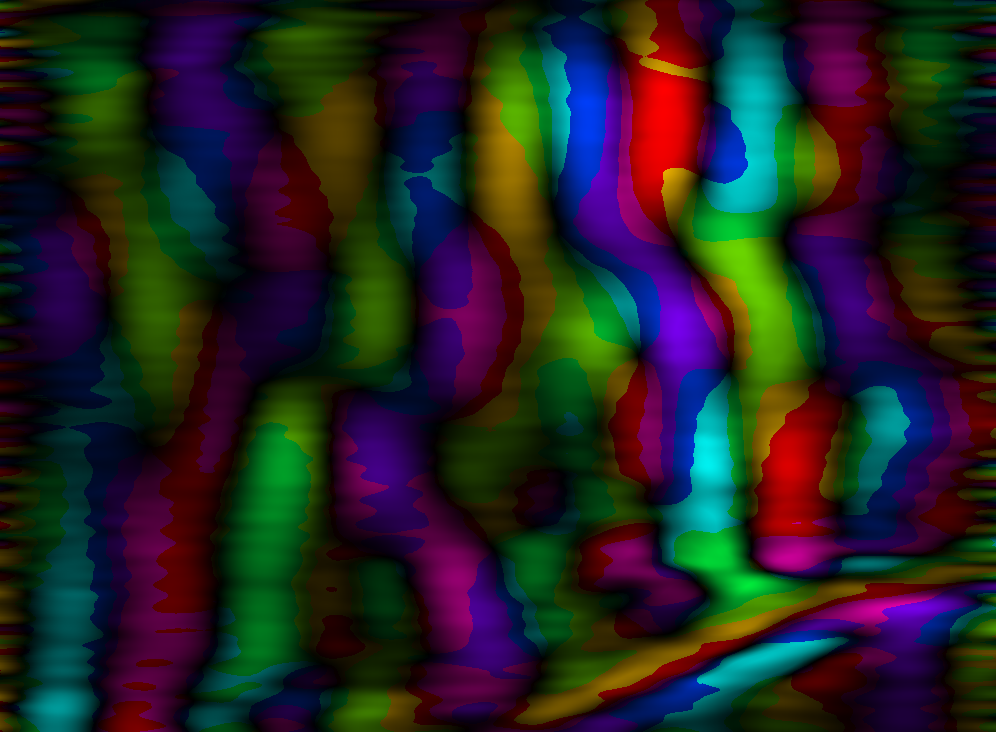

In [81]:
mapname = Symbol("polardomainmap_SF$(blockfl[3])")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(anglemode(a,theta)),1,m),cammaps[3]["angle"],cammaps[3]["abs"])))

### Mean Map

In [104]:
mamap,mmmap=angleabs(mapreduce(i->i["complex"],+,cammaps));

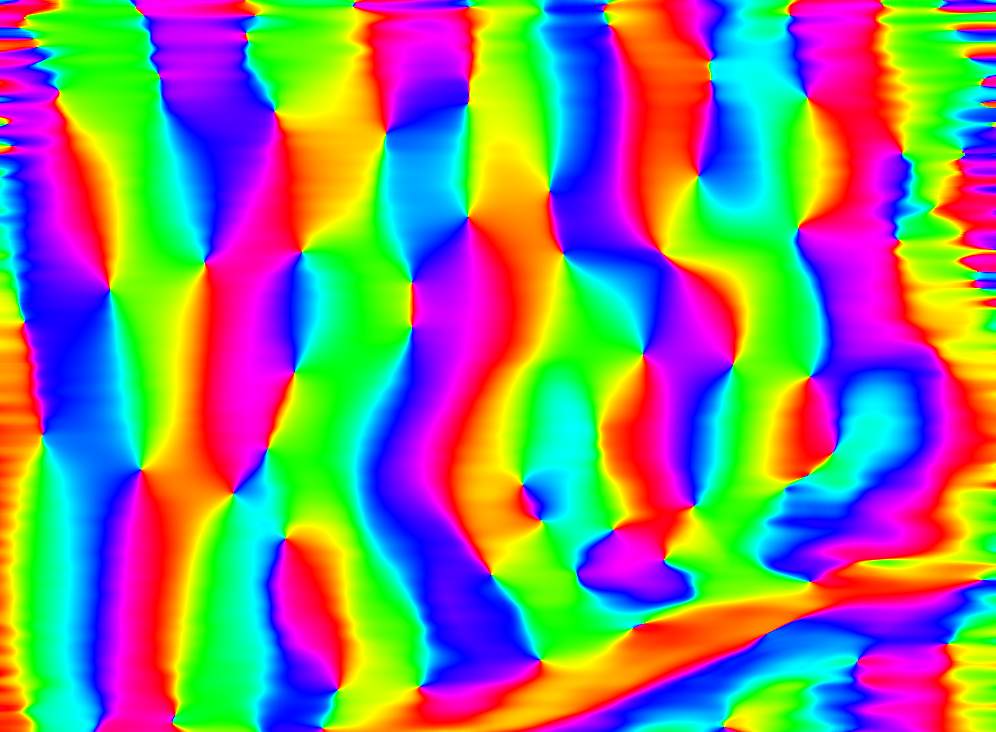

In [105]:
mapname = Symbol("anglemap_mean")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(a),1,1),mamap)))

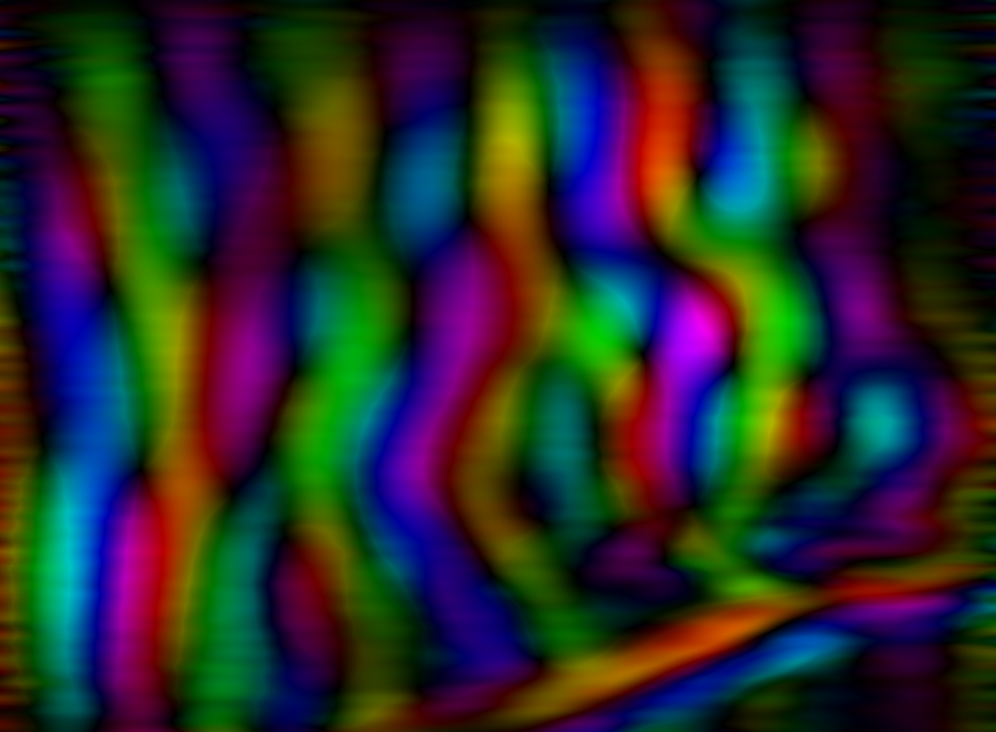

In [106]:
mapname = Symbol("polarmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(a),1,m),mamap,mmmap)))

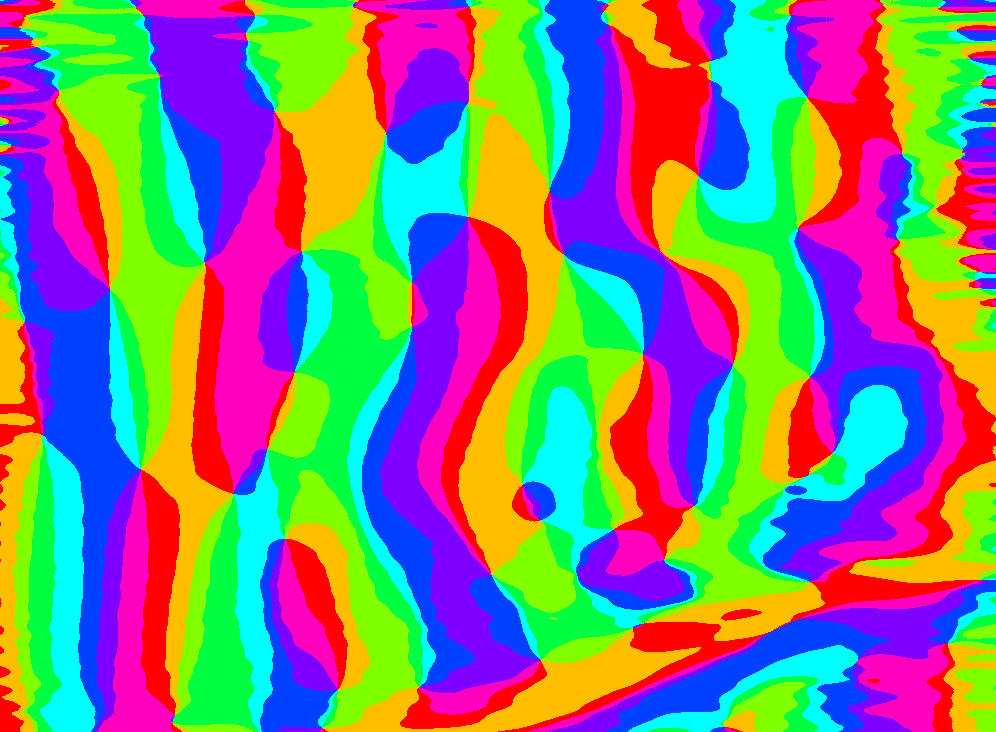

In [85]:
mapname = Symbol("angledomainmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(anglemode(a,theta)),1,1),mamap)))

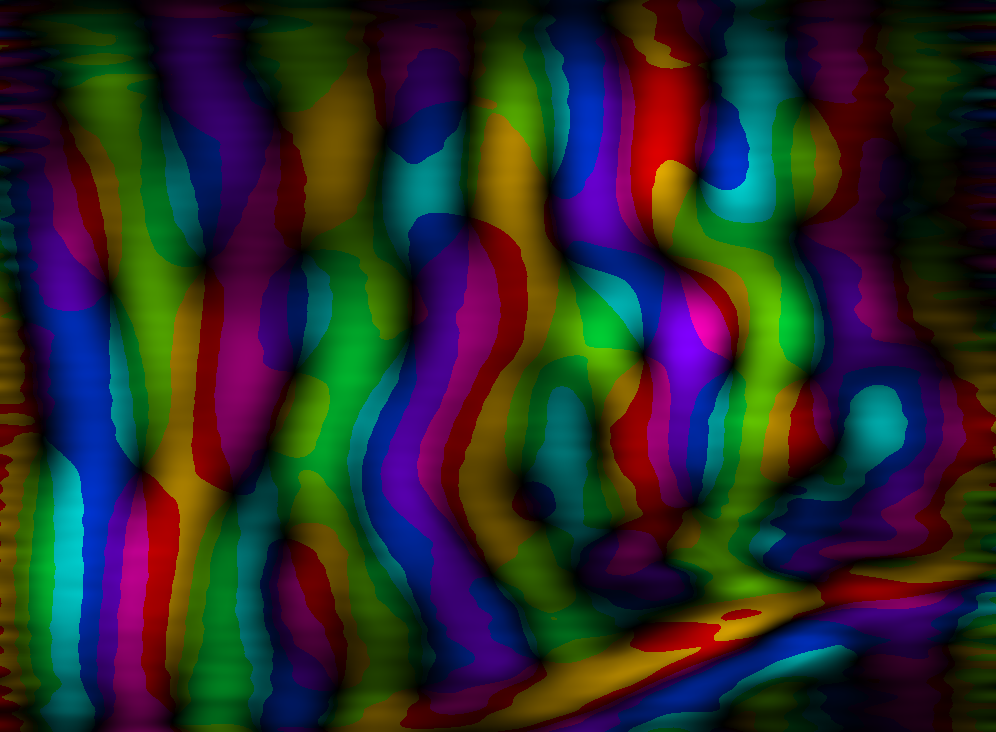

In [86]:
mapname = Symbol("polardomainmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(anglemode(a,theta)),1,m),mamap,mmmap)))

# Align Map

In [87]:
oireffile = map(x->dropdown(readdir("$droot/$x"),label="OIReference"),signal(sdir))

Interact.Options{:Dropdown,String}(47: "input-20" = C1801_E0B0.mat String , "OIReference", "C1801_E0B0.mat", "C1801_E0B0.mat", 1, Interact.OptionDict(DataStructures.OrderedDict("C1801_E0B0.mat"=>"C1801_E0B0.mat","C1801_E0B1.mat"=>"C1801_E0B1.mat","C1801_E0B10.mat"=>"C1801_E0B10.mat","C1801_E0B100.mat"=>"C1801_E0B100.mat","C1801_E0B101.mat"=>"C1801_E0B101.mat","C1801_E0B102.mat"=>"C1801_E0B102.mat","C1801_E0B103.mat"=>"C1801_E0B103.mat","C1801_E0B104.mat"=>"C1801_E0B104.mat","C1801_E0B105.mat"=>"C1801_E0B105.mat","C1801_E0B106.mat"=>"C1801_E0B106.mat"…), Dict("C1801_E1B8.mat"=>"C1801_E1B8.mat","C1801_V2Site4bCh14_V1Site3a_SpatialFreq_1.mat"=>"C1801_V2Site4bCh14_V1Site3a_SpatialFreq_1.mat","C1801_E0B87.mat"=>"C1801_E0B87.mat","C1801_E1B236.mat"=>"C1801_E1B236.mat","C1801_E0B471.mat"=>"C1801_E0B471.mat","C1801_E0B28.mat"=>"C1801_E0B28.mat","C1801_E0B410.mat"=>"C1801_E0B410.mat","C1801_V2Site4bCh6_V1Site3a_SpatialFreq_1.mat"=>"C1801_V2Site4bCh6_V1Site3a_SpatialFreq_1.mat","C1801_E0B378.mat"=>"C1801_E0B378.mat","C1801_E1B158.mat"=>"C1801_E1B158.mat"…)), Any[], Any[], true, "horizontal", true)

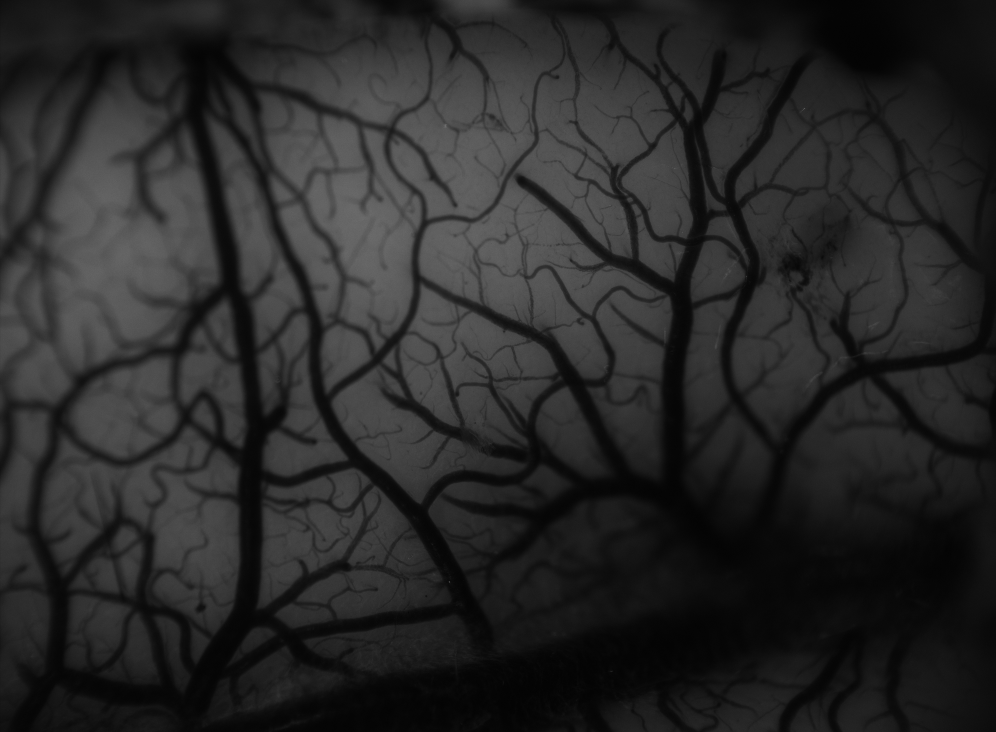

In [88]:
oiref = load("$droot/$(sdir.value)/$(oireffile.value.value)")

In [109]:
alpha = slider(0:0.01:1,value=0.6,label="Map Alpha")

Interact.Slider{Float64}(55: "input-23" = 0.6 Float64 , "Map Alpha", 0.6, 0.0:0.01:1.0, "horizontal", true, ".3f", true)

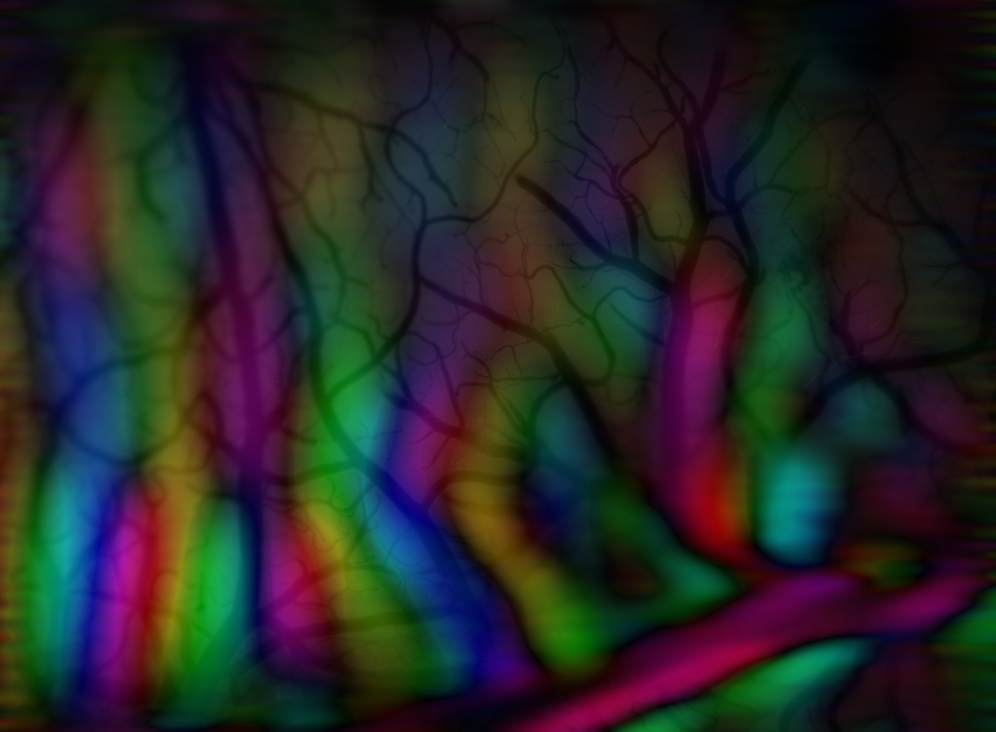

In [111]:
mapname = Symbol("oirefblendpolarmap_SF$(blockfl[1])")
blendname = Symbol("polarmap_SF$(blockfl[1])")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha.value)))

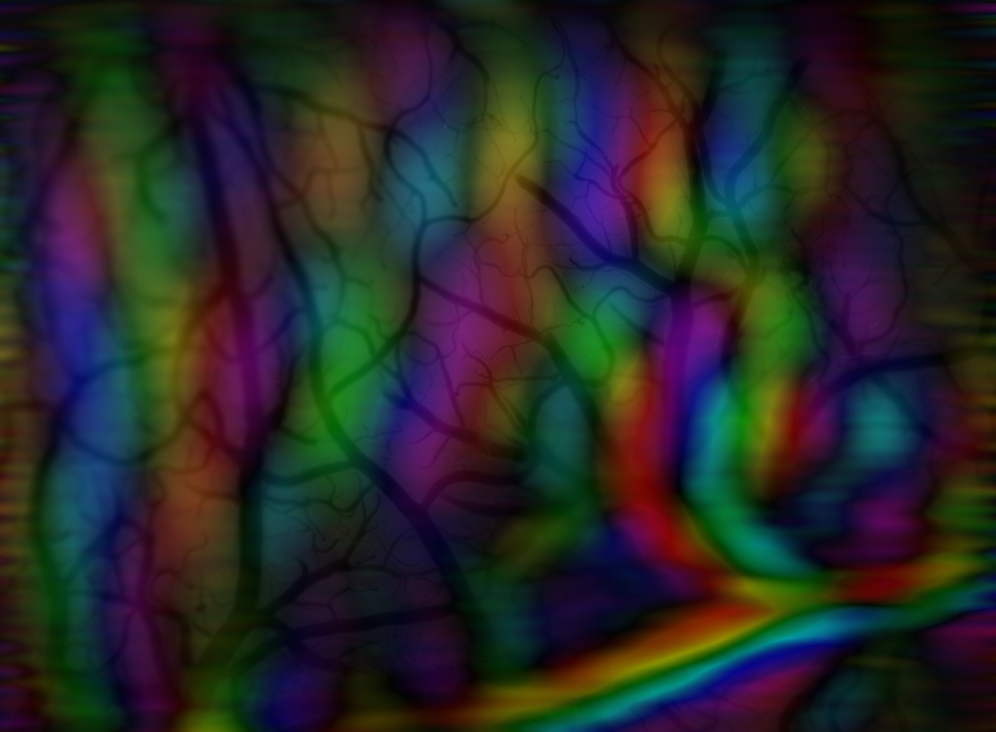

In [112]:
mapname = Symbol("oirefblendpolarmap_SF$(blockfl[2])")
blendname = Symbol("polarmap_SF$(blockfl[2])")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha.value)))

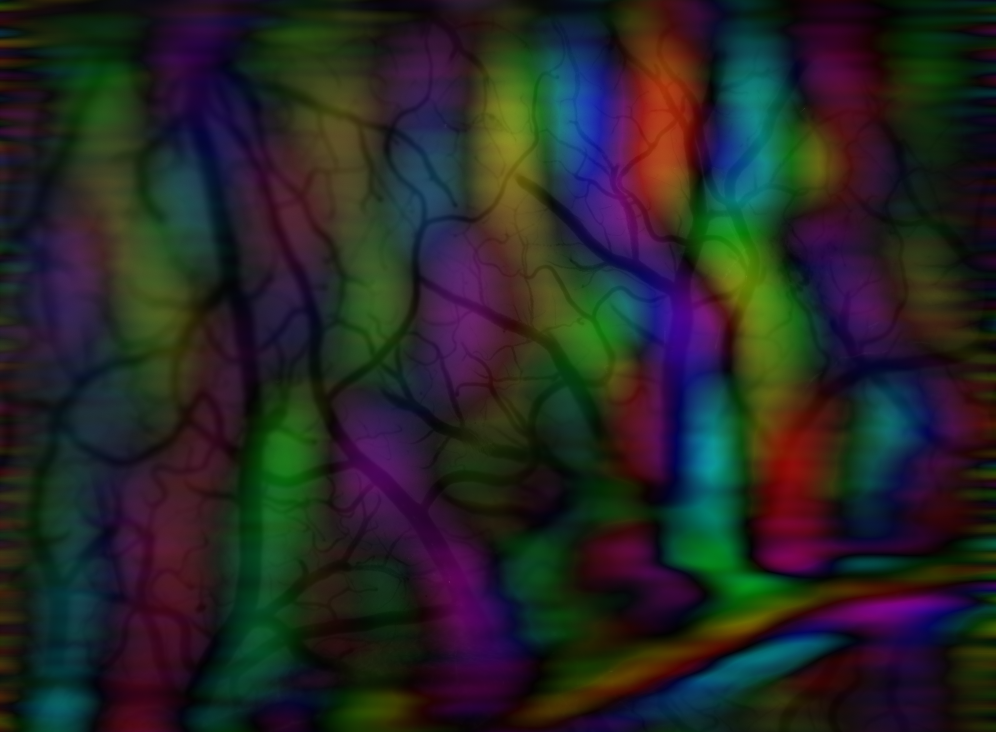

In [113]:
mapname = Symbol("oirefblendpolarmap_SF$(blockfl[3])")
blendname = Symbol("polarmap_SF$(blockfl[3])")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha.value)))

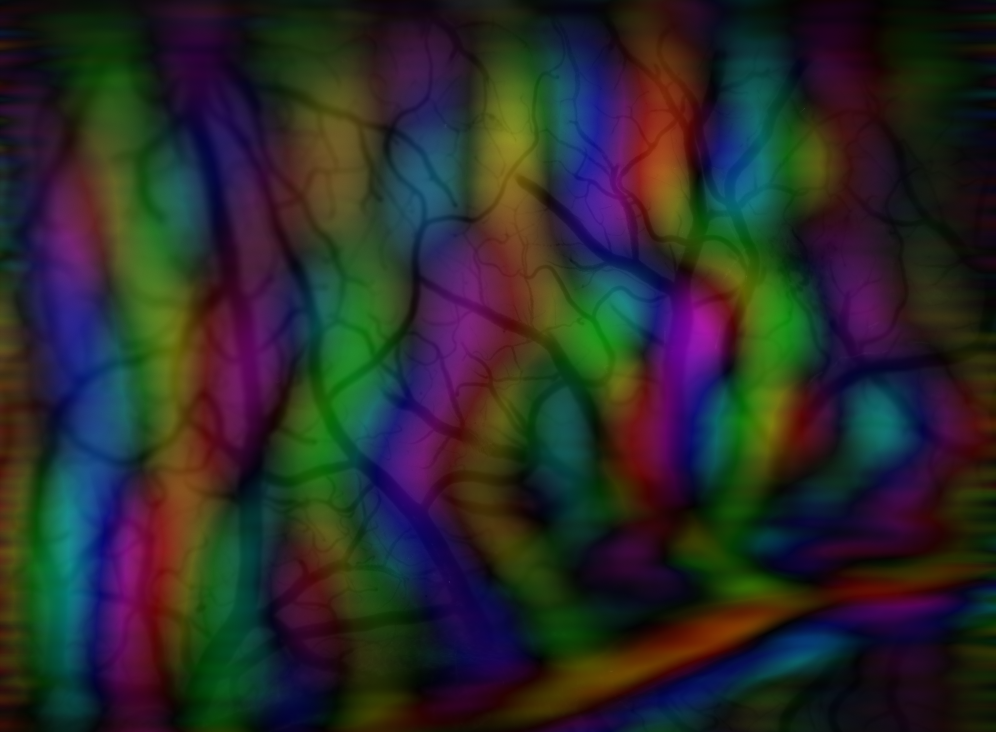

In [118]:
mapname = Symbol("oirefblendpolarmap_mean")
blendname = Symbol("polarmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha.value)))

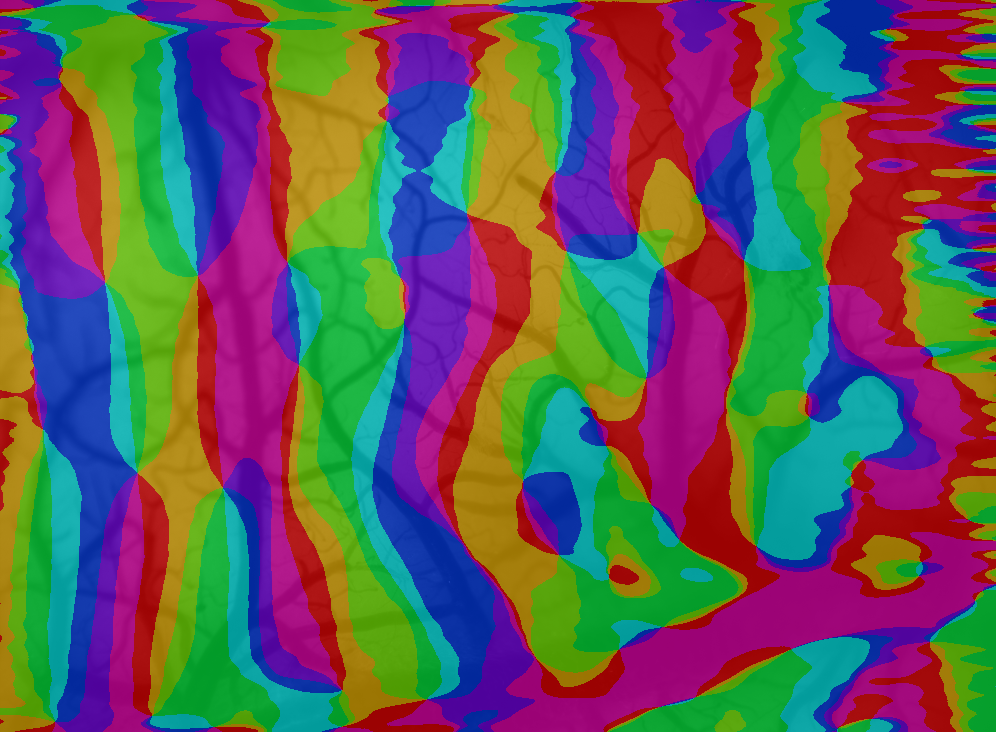

In [115]:
mapname = Symbol("oirefblendangledomainmap_SF$(blockfl[1])")
blendname = Symbol("angledomainmap_SF$(blockfl[1])")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha.value)))

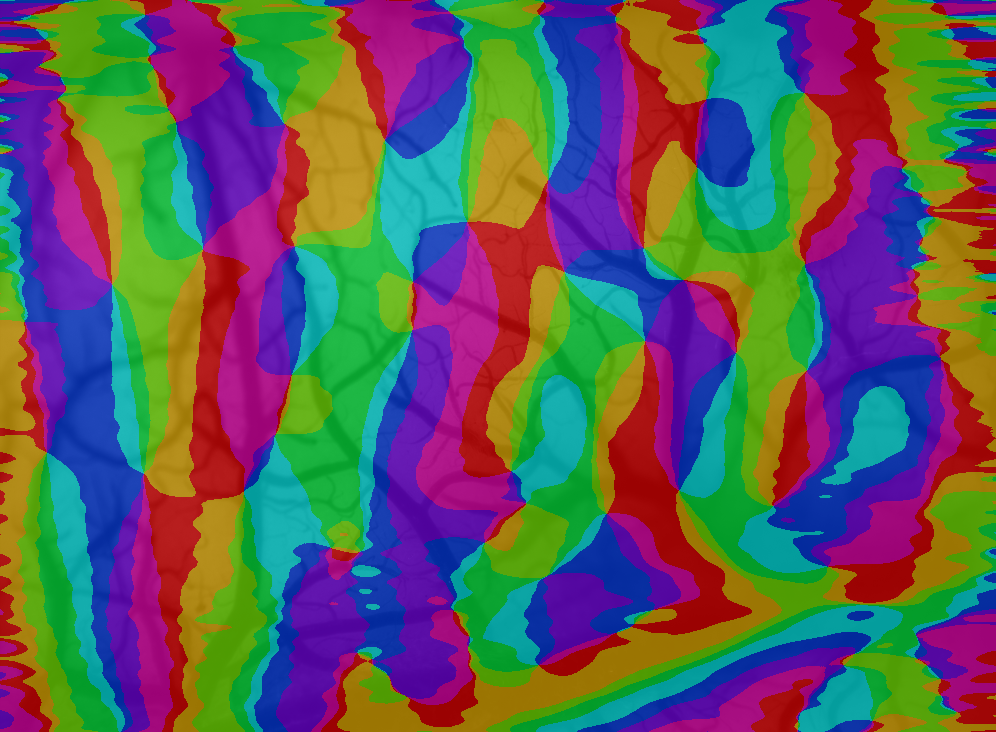

In [116]:
mapname = Symbol("oirefblendangledomainmap_SF$(blockfl[2])")
blendname = Symbol("angledomainmap_SF$(blockfl[2])")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha.value)))

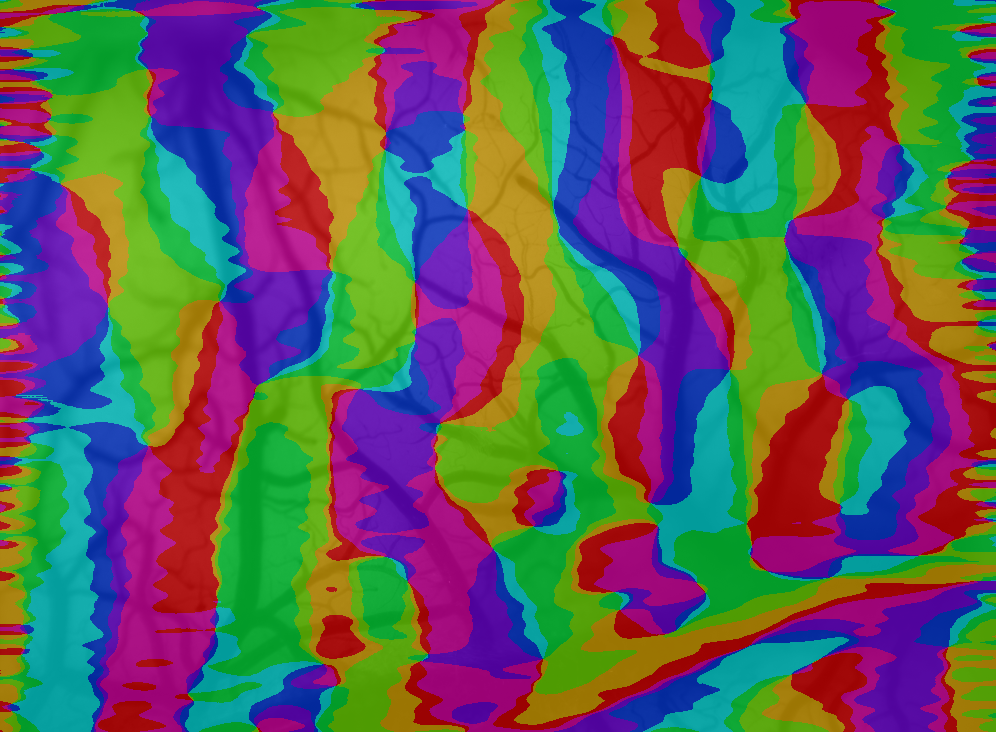

In [117]:
mapname = Symbol("oirefblendangledomainmap_SF$(blockfl[3])")
blendname = Symbol("angledomainmap_SF$(blockfl[3])")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha.value)))

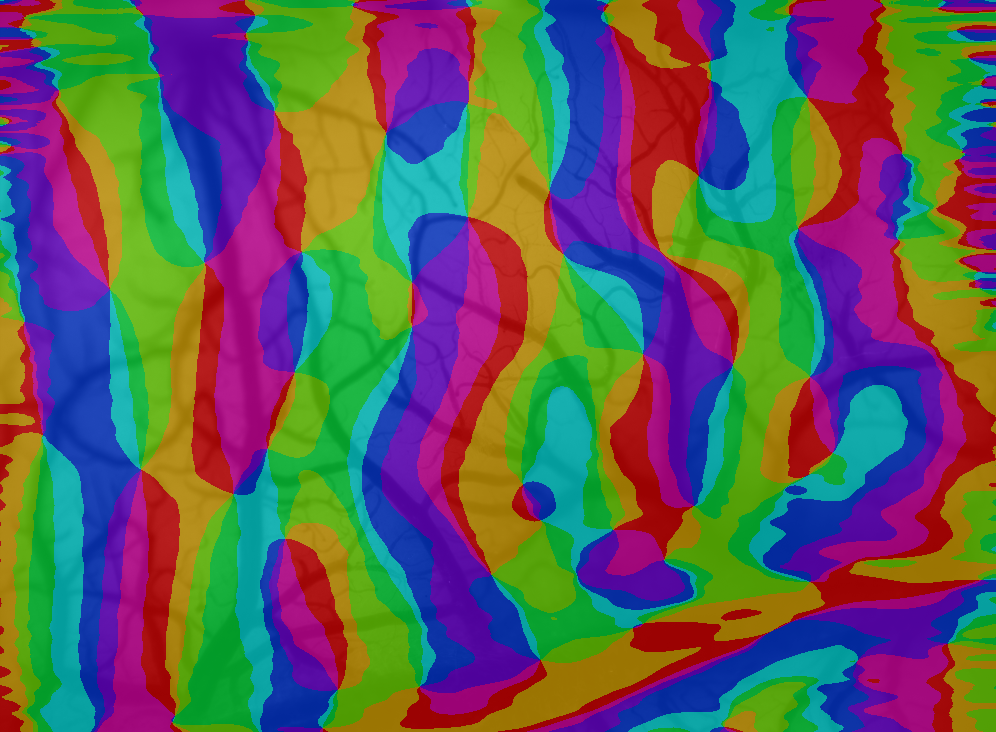

In [119]:
mapname = Symbol("oirefblendangledomainmap_mean")
blendname = Symbol("angledomainmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha.value)))

# Save Results

In [120]:
rdir = "$rroot/$(sdir.value)"
rfhead = splitext("$(vlabfile.value.value)")[1]
isdir(rdir) || mkdir(rdir)
map(eval,map(i->:(save("$rdir/$(rfhead)_"*$(string(i))*".png",$i)),resultmaps));